<a href="https://colab.research.google.com/github/pedro162/computer_vision/blob/main/computer_vision_deep_dream.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
tf.__version__

'2.17.0'

##Loading of the neural network pre trained



In [2]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


In [3]:
base_model.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, None, None, 32) │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, None, None, 32) │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, None, None, 32) │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, None, None, 32) │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, None, None, 32) │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, None, None, 32) │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, None, None, 64) │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, None, None, 64) │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, None, None, 64) │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, None, None, 64) │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, None, None, 80) │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, None, None, 80) │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, None, None, 80) │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, None, None,     │        138,240 │ activation_3[0][0]     │
│                           │ 192)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, None, None,     │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │ 192)                   │                │                        │
├──────────────────────

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [4]:
len(base_model.layers)

311

In [10]:
#names = ['mixed3' , 'mixed5']#Relu
names = ['mixed3' , 'mixed5']#Relu
layers = [base_model.get_layer(name).output for name in names]

In [11]:
layers

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_100>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_164>]

In [12]:
deep_dream_models = tf.keras.Model(inputs=base_model.input, outputs=layers)

In [9]:
deep_dream_models.output

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_100>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_164>]

##Image loaging and pre processing

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [14]:
image = tf.keras.preprocessing.image.load_img("/content/drive/MyDrive/arquivos_curos_visao_computacional/drive-download-20230813T171824Z-001/Images/StaryNight.jpg", target_size=(225,375))

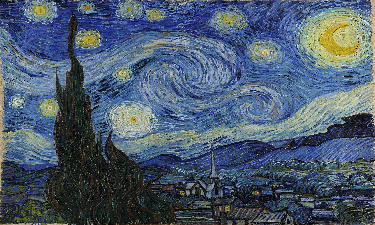

In [15]:
image

In [16]:
type(image)

PIL.Image.Image

In [17]:
image.size

(375, 225)

In [18]:
image.mode

'RGB'

In [19]:
len(image.mode)

3

In [21]:
list(image.getdata())

[(6, 10, 11),
 (30, 33, 66),
 (35, 46, 66),
 (39, 46, 65),
 (46, 49, 68),
 (23, 27, 39),
 (13, 15, 38),
 (57, 61, 86),
 (85, 88, 97),
 (147, 147, 139),
 (138, 139, 123),
 (112, 116, 117),
 (18, 21, 52),
 (23, 28, 60),
 (85, 96, 116),
 (83, 92, 121),
 (148, 152, 155),
 (29, 32, 63),
 (57, 63, 99),
 (12, 20, 39),
 (34, 39, 69),
 (23, 30, 56),
 (4, 12, 48),
 (25, 32, 74),
 (48, 50, 98),
 (134, 133, 173),
 (127, 132, 152),
 (126, 133, 161),
 (138, 151, 168),
 (64, 76, 126),
 (67, 83, 119),
 (61, 75, 112),
 (73, 90, 134),
 (86, 118, 143),
 (55, 81, 80),
 (136, 155, 135),
 (51, 65, 74),
 (152, 169, 195),
 (156, 176, 211),
 (56, 79, 129),
 (94, 116, 165),
 (70, 94, 120),
 (160, 173, 189),
 (142, 156, 185),
 (92, 118, 135),
 (50, 74, 118),
 (107, 132, 162),
 (101, 122, 153),
 (27, 36, 67),
 (34, 44, 79),
 (97, 114, 140),
 (21, 41, 66),
 (51, 60, 101),
 (50, 56, 104),
 (34, 39, 68),
 (22, 24, 45),
 (3, 3, 29),
 (4, 7, 22),
 (28, 37, 34),
 (19, 27, 29),
 (19, 25, 41),
 (43, 49, 75),
 (93, 104, 1

In [22]:
image = tf.keras.preprocessing.image.img_to_array(image)

In [23]:
type(image)

numpy.ndarray

In [24]:
image.shape

(225, 375, 3)

In [25]:
image.min(), image.max()

(0.0, 255.0)

In [26]:
#image =  image/255
image = tf.keras.applications.inception_v3.preprocess_input(image)

In [27]:
image.min(), image.max()

(-1.0, 1.0)

##Neural network activation

In [28]:
image.shape

(225, 375, 3)

In [29]:
batch_image = tf.expand_dims(image, axis=0)
batch_image.shape

TensorShape([1, 225, 375, 3])

In [37]:
activations = deep_dream_models.predict(batch_image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


In [38]:
deep_dream_models.outputs

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_100>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_164>]

In [41]:
activations[1]

array([[[[0.        , 0.        , 1.495174  , ..., 0.        ,
          0.        , 0.        ],
         [2.1904178 , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [1.2252213 , 0.        , 0.39388067, ..., 0.        ,
          0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.27098528, ..., 1.2395096 ,
          0.        , 0.        ],
         [0.        , 0.15095711, 0.6426553 , ..., 0.916707  ,
          0.        , 0.        ],
         [0.        , 0.        , 1.6167879 , ..., 0.59690696,
          0.        , 0.        ]],

        [[0.        , 0.        , 0.        , ..., 0.05806461,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.6703993 , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        , ..., 1.2452434 ,
          0.        , 0.0

In [42]:
activations[0].shape, activations[1].shape

((1, 12, 21, 768), (1, 12, 21, 768))

##Error calc

In [60]:
def error_calc(image, network):
  batch_image = tf.expand_dims(image, axis=0)
  activations = network.predict(batch_image)
  errors = []
  for activation in activations:
    mean = tf.reduce_mean(activation)
    errors.append(mean)
  #print(errors)
  #print(np.shape(errors))
  #print(tf.reduce_sum(errors))
  return tf.reduce_sum(errors)

In [55]:
loss = error_calc(image, deep_dream_models)
loss

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


<tf.Tensor: shape=(), dtype=float32, numpy=0.61807656>

##Gradient up

In [65]:
!pip install tensorflow
import tensorflow as tf
import matplotlib.pyplot as plt

In [83]:
def error_calc(image, network):
    batch_image = tf.expand_dims(image, axis=0)
    activations = network(batch_image)  # Avoid .predict, use network as a callable function
    errors = []
    for activation in activations:
        mean = tf.reduce_mean(activation)
        errors.append(mean)
    return tf.reduce_sum(errors)

def deep_dream(network, image, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        error = error_calc(image, network)

    gradients = tape.gradient(error, image)
    gradients /= tf.math.reduce_std(gradients)
    image = image + learning_rate * gradients
    image = tf.clip_by_value(image, -1, 1)

    return error, image

def convert_image(image):
    image = 255 * (image + 1.0) / 2.0
    return tf.cast(image, tf.uint8)

def execut_deep_dream(network, image, epochs, learning_rate):
    # Convert the image to a tf.Variable for modification
    image = tf.Variable(tf.convert_to_tensor(image))

    for epoch in range(epochs):
        error, image = deep_dream(network, image, learning_rate)
        if epoch % 200 == 0:
            plt.figure(figsize=(12,12))
            plt.imshow(convert_image(image))
            plt.show()
            print(f"Epoch: {epoch}, Error: {error}")



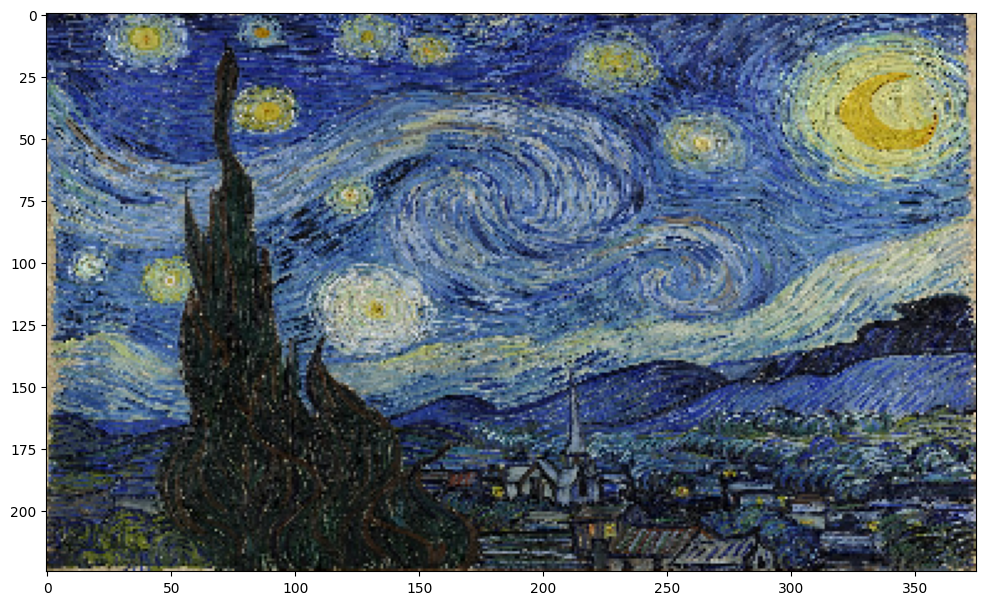

Epoch: 0, Error: 0.6180765628814697


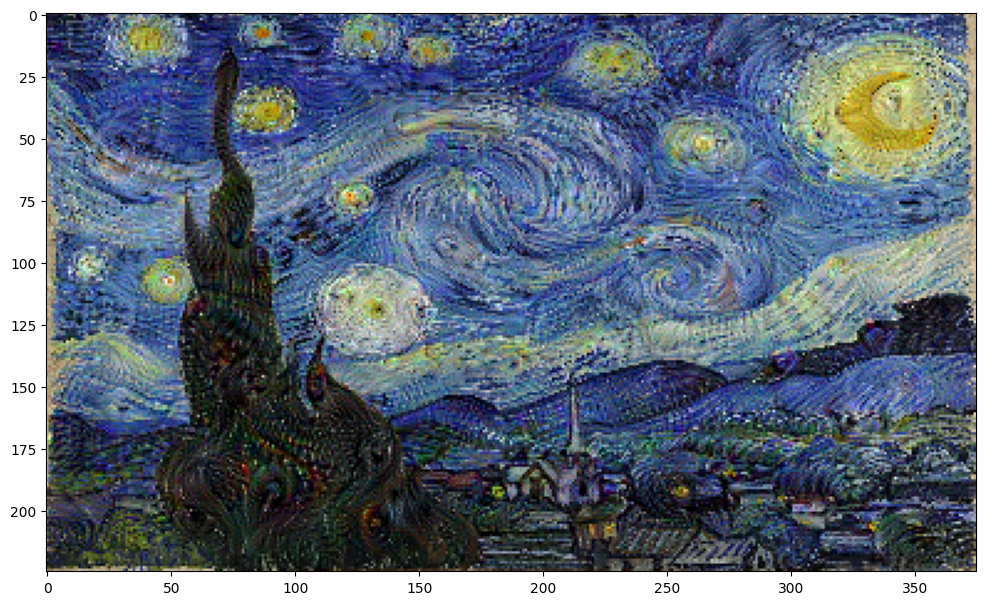

Epoch: 200, Error: 1.7296247482299805


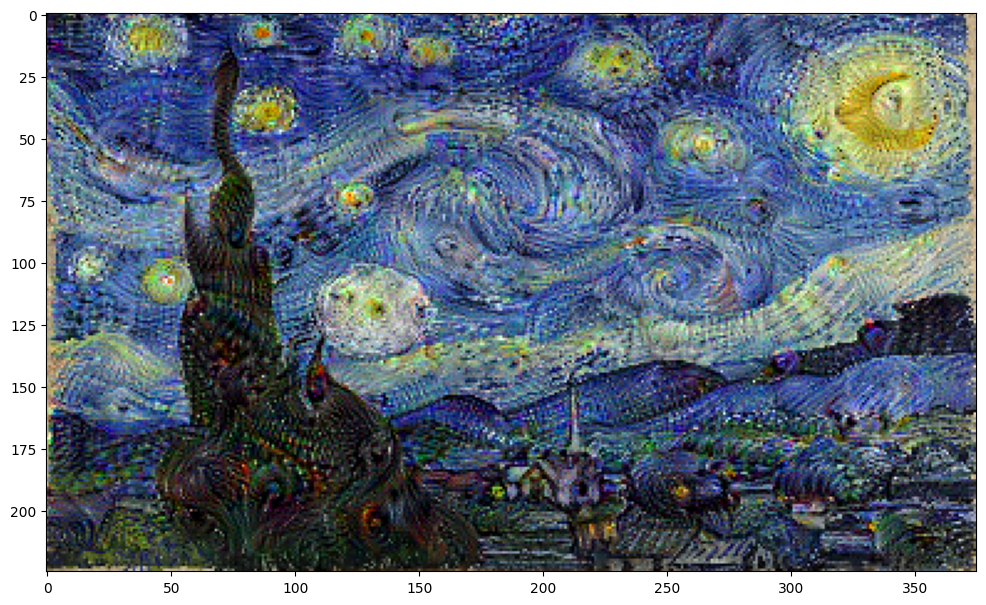

Epoch: 400, Error: 2.057338237762451


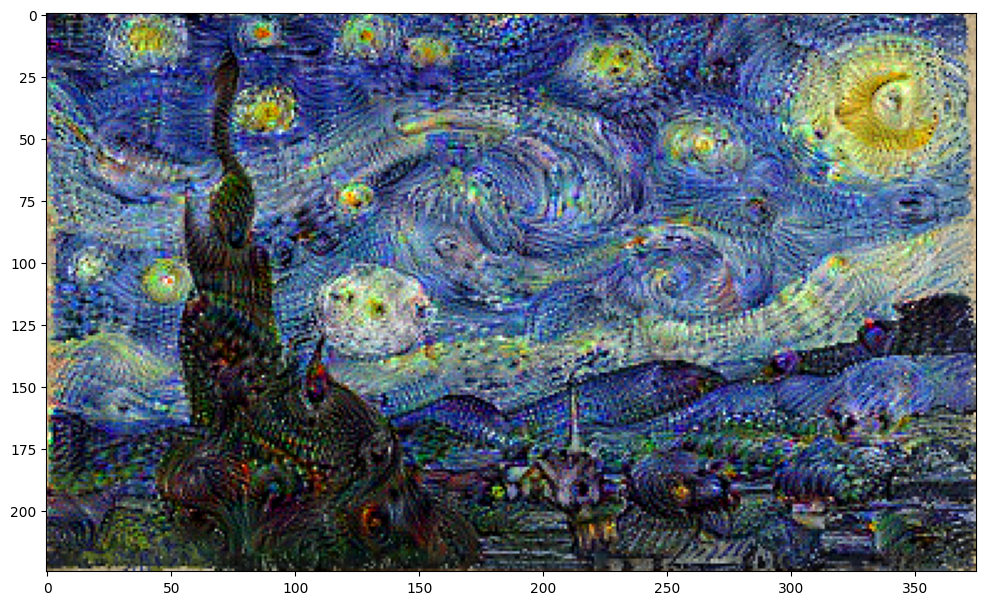

Epoch: 600, Error: 2.2622790336608887


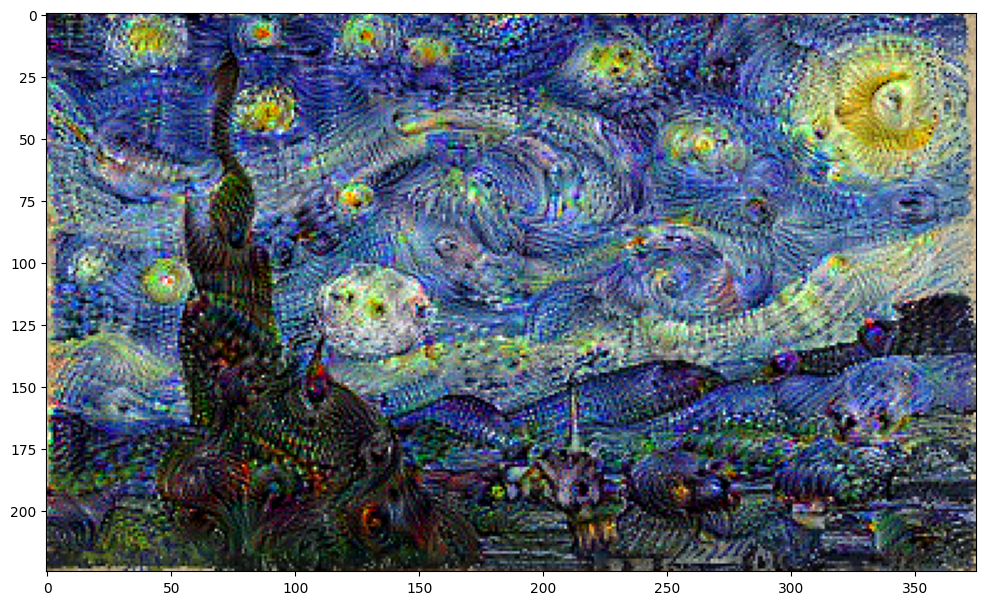

Epoch: 800, Error: 2.413797378540039


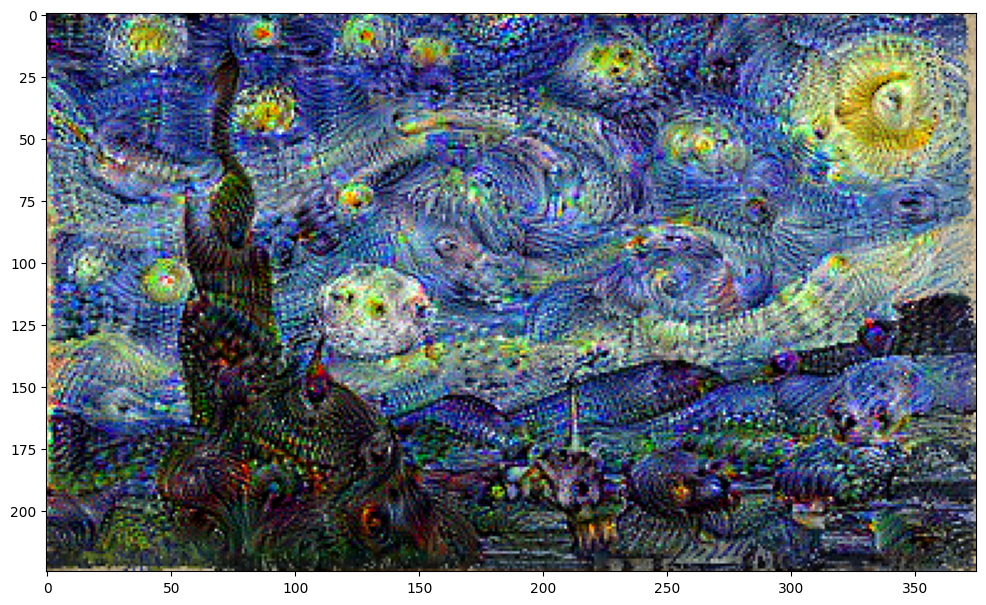

Epoch: 1000, Error: 2.542405605316162


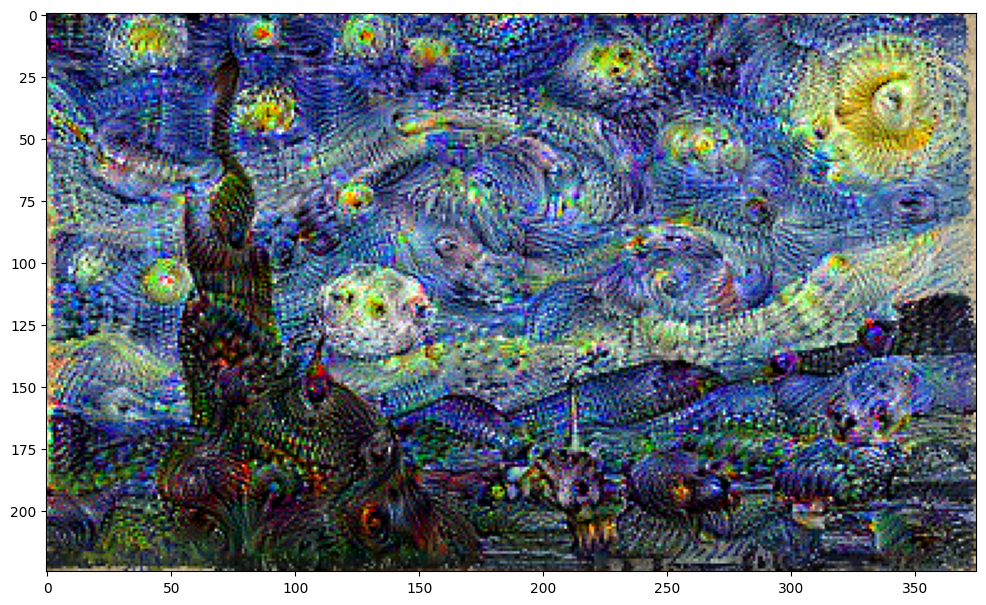

Epoch: 1200, Error: 2.655179023742676


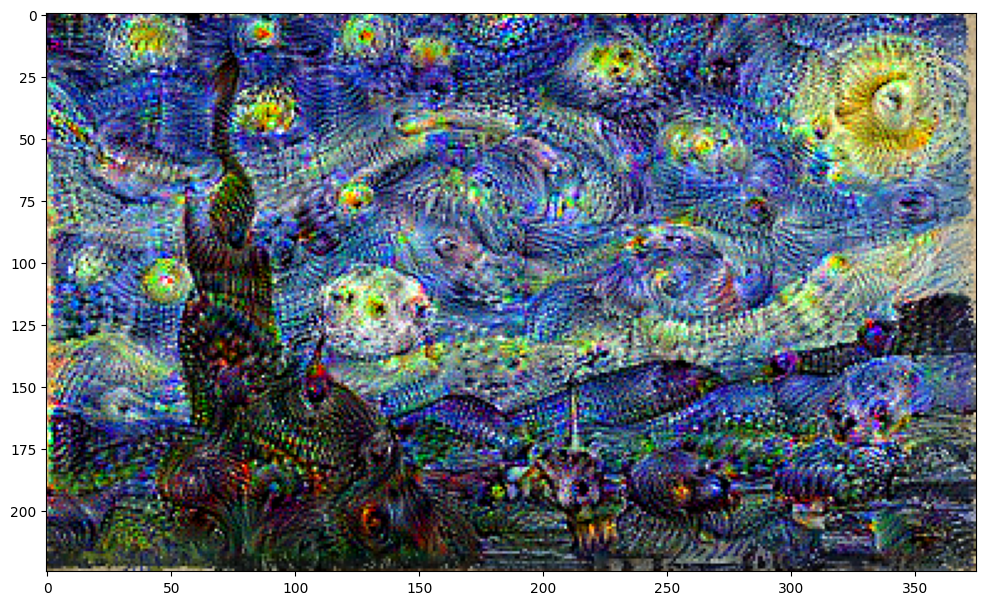

Epoch: 1400, Error: 2.7585113048553467


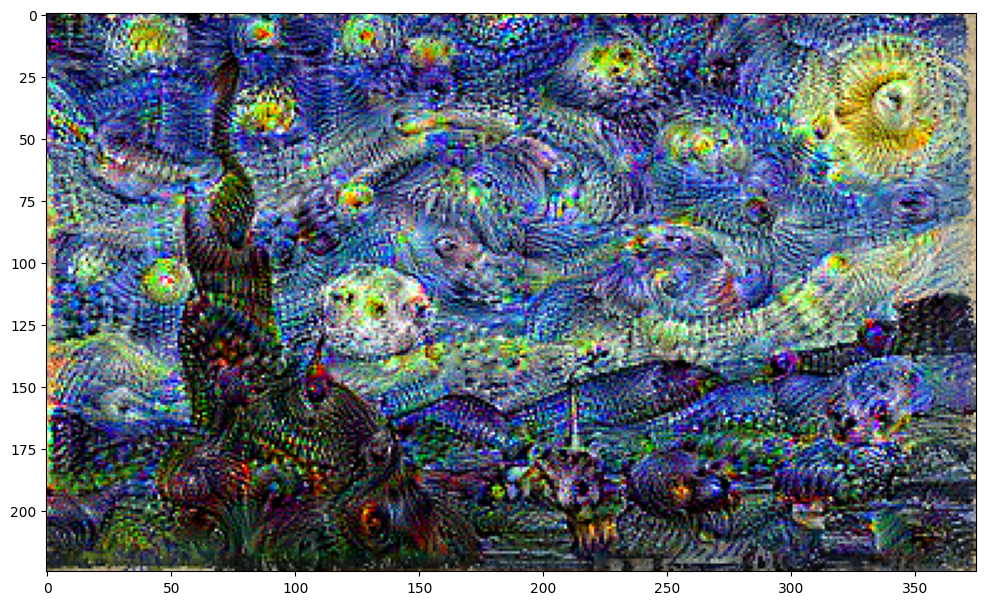

Epoch: 1600, Error: 2.848100185394287


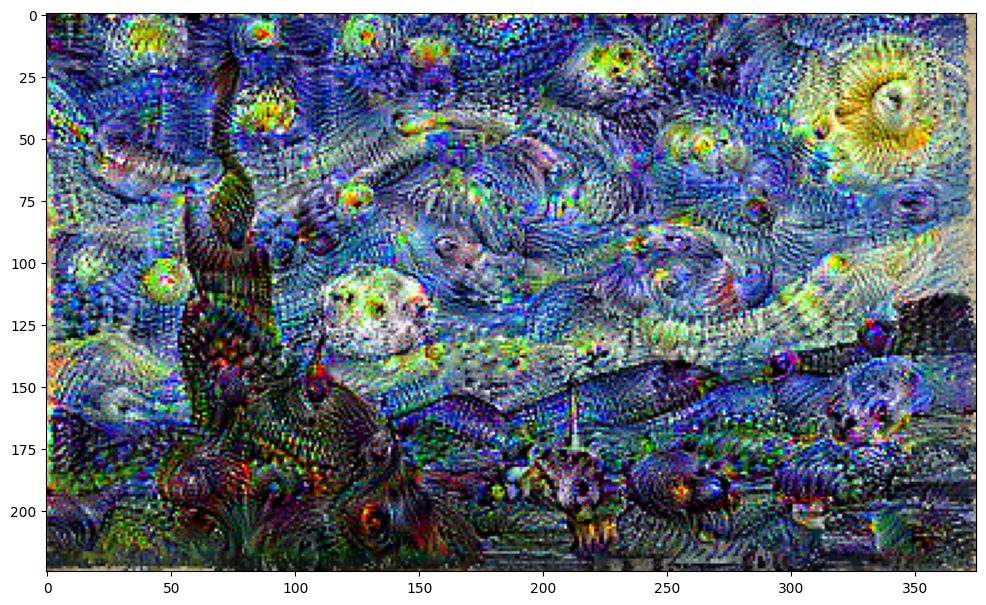

Epoch: 1800, Error: 2.929213523864746


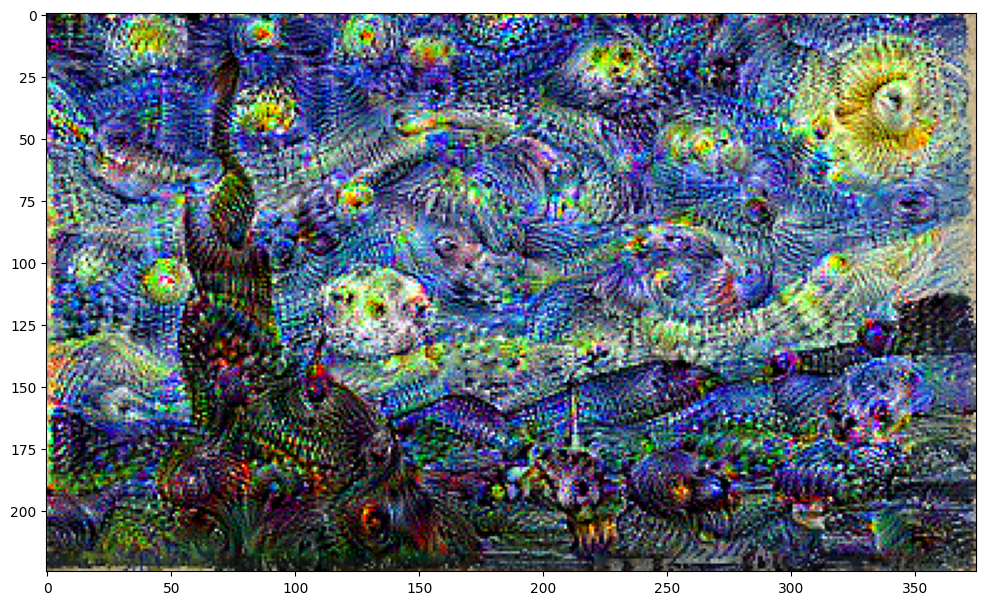

Epoch: 2000, Error: 3.005861282348633


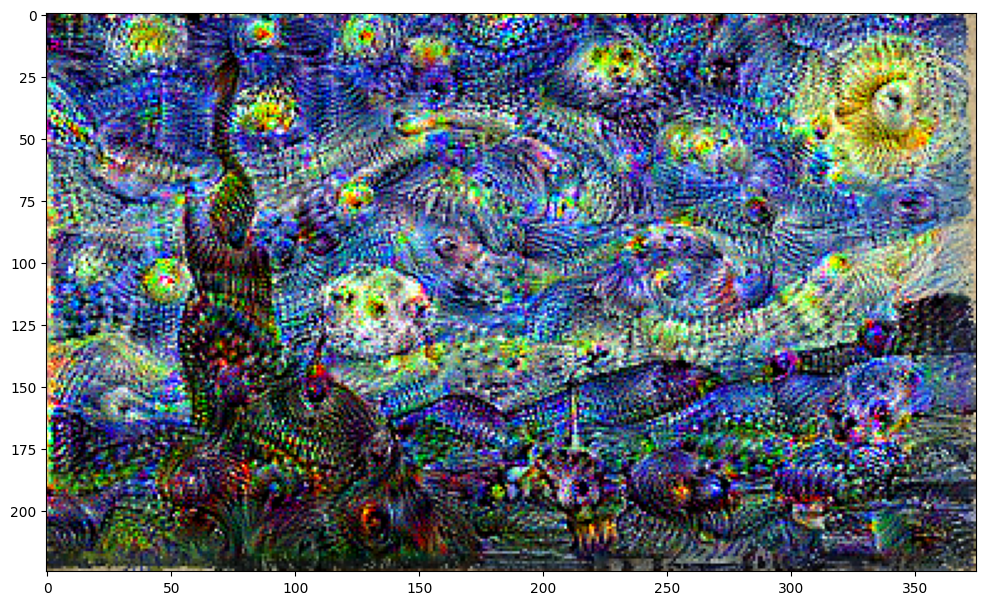

Epoch: 2200, Error: 3.0792160034179688


In [ ]:
execut_deep_dream(deep_dream_models, image, 8000, 0.001)

In [ ]:
image = tf.keras.preprocessing.image.load('/content/drive/MyDrive/arquivos_curos_visao_computacional/drive-download-20230813T171824Z-001/Images/sky.jpeg')

In [ ]:
plt.imshow(image)

In [ ]:
image = tf.keras.preprocessing.image.img_toarray(image)
image = tf.keras.applications.inception_v3.preprocess_input(image)

In [ ]:
execut_deep_dream(deep_dream_models, image, 8000, 0.001)